In [ ]:
# Adapted from other notebooks:
### Multimodal Gemini notebooks
# https://github.com/GoogleCloudPlatform/generative-ai/blob/main/gemini/use-cases/intro_multimodal_use_cases.ipynb
# https://github.com/GoogleCloudPlatform/generative-ai/blob/main/gemini/getting-started/intro_gemini_1_5_pro.ipynb
# https://github.com/GoogleCloudPlatform/generative-ai/blob/main/gemini/getting-started/intro_gemini_python.ipynb

#Embeddings 
#Multimodal Vector Search
# https://github.com/GoogleCloudPlatform/vertex-ai-samples/blob/main/notebooks/official/matching_engine/sdk_matching_engine_create_multimodal_embeddings.ipynb

In [31]:
pip install --upgrade google-cloud-aiplatform google-cloud-storage


INFO: pip is looking at multiple versions of google-api-core[grpc] to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.6/125.6 kB 1.4 MB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.3/138.3 kB 2.1 MB/s eta 0:00:00 0:00:01
  Attempting uninstall: google-api-core
    Found existing installation: google-api-core 1.34.1
    Uninstalling google-api-core-1.34.1:
      Successfully uninstalled google-api-core-1.34.1
  You can safely remove it manually.
  Attempting uninstall: google-cloud-storage
    Found existing installation: google-cloud-storage 2.14.0
    Uninstalling google-cloud-storage-2.14.0:
      Successfully uninstalled google-cloud-storage-2.14.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-api-python-client 1.8.0 requires google-api-c

In [9]:
#insert your project ID and location
PROJECT_ID = "greg-demos1"
LOCATION = "us-central1"
MODEL_NAME = "gemini-1.5-pro-preview-0514"

INDEX_DATA_BUCKET_NAME = "gs://mulitmodal-greg-demos1-unique/embeddings"

In [60]:
import vertexai
from vertexai.generative_models import GenerativeModel, Part, FinishReason, Image
import vertexai.preview.generative_models as generative_models
import IPython

In [7]:
vertexai.init(project=PROJECT_ID, location=LOCATION)

#"gemini-1.5-pro-preview-0514"
model = GenerativeModel(MODEL_NAME)

In [8]:
shelf_img = Image.load_from_file("stuff_on_a_shelf.png")

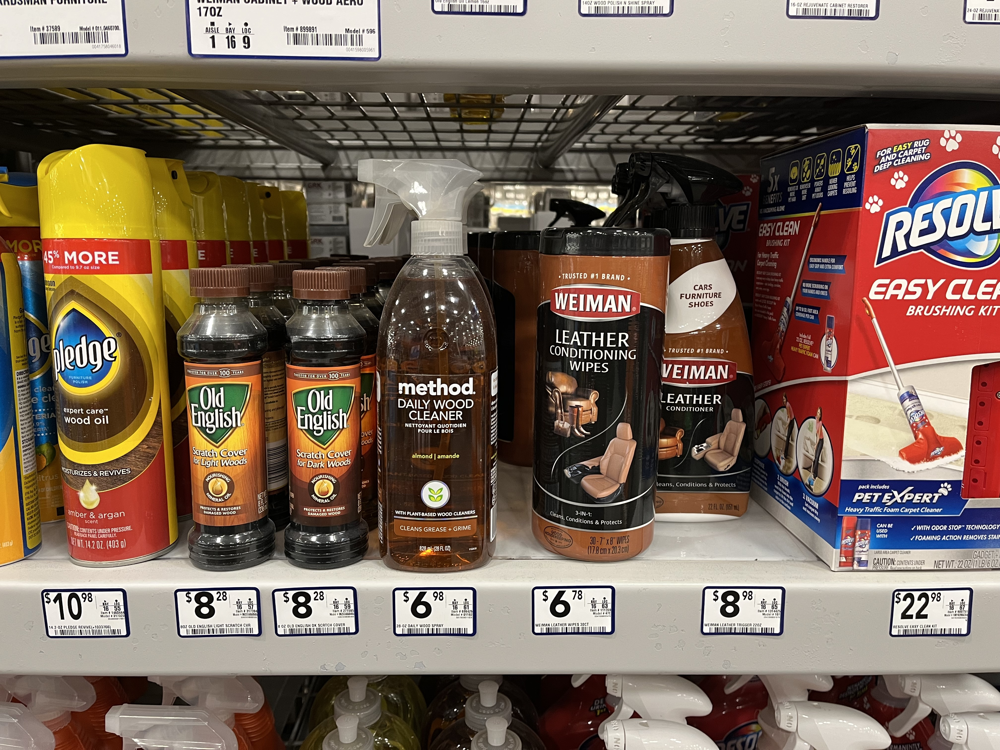

In [6]:
IPython.display.Image("stuff_on_a_shelf.png", width=750, height=750)

In [112]:
textprompt = """
  Briefly describe each product you see in this picture. 
  Include the brand, description, price, size and item number. 
  If you can not determine the size, mark it as NA. Format the output as a csv with each item on a different row
  """

In [113]:
response = model.generate_content([shelf_img, textprompt])
print(response.text)

brand,description,price,size,item_number
Pledge,expert care wood oil,10.98,14.2 OZ,1460444
Old English,Scratch Cover for Light Woods,8.28,8 OZ,317394
Old English,Scratch Cover for Dark Woods,8.28,8 OZ,271565
Method,Daily Wood Cleaner,6.98,28 OZ,696426
Weiman,Leather Conditioning Wipes,6.78,30 CT,111359
Weiman,Leather Conditioner,8.98,22 FL OZ,1314425
Resolve,Easy Clean Brushing Kit,22.98,NA,900751



In [115]:
textprompt = """
  Briefly describe each product you see in this picture. 
  Include the brand, description, price, size and item number. 
  If you can not determine the size, mark it as NA. Format the output as JSON with each item on a different row
  """

In [116]:
response = model.generate_content([shelf_img, textprompt])
print(response.text)

[
  {
    "brand": "Pledge",
    "description": "Revive",
    "price": "10.98",
    "size": "14.2 oz",
    "item_number": "1460444"
  },
  {
    "brand": "Old English",
    "description": "Scratch Cover for Light Woods",
    "price": "8.28",
    "size": "8 oz",
    "item_number": "317394"
  },
  {
    "brand": "Old English",
    "description": "Scratch Cover for Dark Woods",
    "price": "8.28",
    "size": "8 oz",
    "item_number": "271565"
  },
  {
    "brand": "Method",
    "description": "Daily Wood Cleaner",
    "price": "6.98",
    "size": "28 oz",
    "item_number": "696426"
  },
  {
    "brand": "Weiman",
    "description": "Leather Conditioning Wipes",
    "price": "6.78",
    "size": "30 ct",
    "item_number": "111359"
  },
  {
    "brand": "Weiman",
    "description": "Leather Conditioner",
    "price": "8.98",
    "size": "22 fl oz",
    "item_number": "1314425"
  },
  {
    "brand": "Resolve",
    "description": "Easy Clean Brushing Kit",
    "price": "22.98",
    "size"

In [10]:
responses = model.generate_content([shelf_img, "what is the most expensive item on the shelf?"], stream=True)

for response in responses:
    print(response.text, end="")

The most expensive item is the Resolve Easy Clean Kit at $22.98.

In [72]:
# Load example image
image_url = "gs://generativeai-downloads/images/scones.jpg"
image_content = Part.from_uri(image_url, "image/jpeg")

# pdf_file_uri = "gs://cloud-samples-data/generative-ai/pdf/2403.05530.pdf"
#pdf_content = Part.from_uri(pdf_file_uri, mime_type="application/pdf")

# video_content = Part.from_uri("gs://cloud-samples-data/video/animals.mp4", mime_type="video/mp4")

# audio_file_uri = "gs://cloud-samples-data/generative-ai/audio/pixel.mp3"
# audio_file = Part.from_uri(audio_file_uri, mime_type="audio/mpeg")

image_content

file_data {
  mime_type: "image/jpeg"
  file_uri: "gs://generativeai-downloads/images/scones.jpg"
}

In [ ]:
#optional configs
generation_config = {
    "max_output_tokens": 8192,
    "temperature": 1,
    "top_p": 0.95,
}

#block [few, some, most]
safety_settings = {
    generative_models.HarmCategory.HARM_CATEGORY_HATE_SPEECH: generative_models.HarmBlockThreshold.BLOCK_MEDIUM_AND_ABOVE,
    generative_models.HarmCategory.HARM_CATEGORY_DANGEROUS_CONTENT: generative_models.HarmBlockThreshold.BLOCK_MEDIUM_AND_ABOVE,
    generative_models.HarmCategory.HARM_CATEGORY_SEXUALLY_EXPLICIT: generative_models.HarmBlockThreshold.BLOCK_MEDIUM_AND_ABOVE,
    generative_models.HarmCategory.HARM_CATEGORY_HARASSMENT: generative_models.HarmBlockThreshold.BLOCK_MEDIUM_AND_ABOVE,
}

In [21]:
#stream response instead of waiting for full response
responses = model.generate_content([image_content, "what is this image?"], stream=True)

for response in responses:
    print(response.text, end="")

 The image is of five blueberry scones arranged on a piece of baking paper. There is a bowl of fresh blueberries and a spoon resting on the paper, and a cup of coffee and pink peonies on the side.  

In [69]:
audio_file_uri = "gs://cloud-samples-data/generative-ai/audio/pixel.mp3"
audio_file = Part.from_uri(audio_file_uri, mime_type="audio/mpeg")

In [73]:
audio_file_path = "cloud-samples-data/generative-ai/audio/pixel.mp3"
audio_file_url = f"https://storage.googleapis.com/{audio_file_path}"

IPython.display.Audio(audio_file_url)

In [44]:
prompt = """
  Can you transcribe this interview, in the format of timecode, speaker, caption.
  Use speaker A, speaker B, etc. to identify the speakers.
"""

contents = [audio_file, prompt]

response = model.generate_content(contents)
print(response.text)

## Interview Transcription:

**00:00** | Speaker A | your devices are getting better over time and so we think about it across the entire portfolio from phones to watch, to buds, to tablet, we get really excited about how we can tell a joint narrative across everything.

**00:14** | Speaker B | Welcome to the Made by Google Podcast where we meet the people who work on the Google products you love. Here's your host, Rashid Finch. 

**00:22** | Speaker B | Today, we're talking to Aisha Sharif and De Carlos Love. They're both product managers for various Pixel devices and work on something that all the Pixel owners love. The Pixel feature drops.

**00:33** | Speaker C | This is the Made by Google podcast.

**00:35** | Speaker B | Aisha, which feature on your Pixel phone has been most transformative in your own life?

**00:41** | Speaker A | So many features. I am a singer, so I actually think recorder transcription has been incredible because before I would record songs, I'd just like fre

In [48]:
responses = model.generate_content([response.text, "Can you summarize this audio transcript?"], stream=True)

for response in responses:
    print(response.text, end="")

## Podcast Summary: Made by Google Podcast - March Feature Drop

This episode of the Made by Google Podcast focuses on the March 2023 Pixel Feature Drop, discussing exciting new features and updates for Pixel phones and Pixel Watch. 

**Key Highlights:**

* **Focus on Device Longevity:** Both Aisha and De Carlos emphasize the commitment to making Pixel devices better over time, with updates and features extending the lifespan and functionality of older models. 
* **Pixel Watch Updates:**
    * **Pixel Watch 1 Enhancement:** Features like pace and heart rate zone training, automatic workout detection, and the Fitbit Relax app are now available on the first-generation Pixel Watch.
    * **SPO2 Tracking:** De Carlos highlights the previous addition of overnight oxygen saturation measurement as a significant feature drop for Pixel Watch.
* **Pixel Phone Updates:**
    * **Circle to Search Expansion:** The ability to search from any screen using a circled selection now extends to Pixel 7 an

In [83]:
#public video link 
#https://storage.googleapis.com/cloud-samples-data/generative-ai/video/behind_the_scenes_pixel.mp4
video_file_uri = "gs://cloud-samples-data/generative-ai/video/behind_the_scenes_pixel.mp4"
video_file = Part.from_uri(video_file_uri, mime_type="video/mp4")

#image link
# https://storage.googleapis.com/cloud-samples-data/generative-ai/image/a-man-and-a-dog.png"
image_file_uri = "gs://cloud-samples-data/generative-ai/image/a-man-and-a-dog.png"
image_file = Part.from_uri(image_file_uri, mime_type="image/png")

video_file_path = "cloud-samples-data/generative-ai/video/behind_the_scenes_pixel.mp4"
video_file_url = f"https://storage.googleapis.com/{video_file_path}"

IPython.display.Video(video_file_url, width=450)

In [79]:
prompt = """
  Watch each frame in the video carefully and answer the questions.
  Only base your answers strictly on what information is available in the video attached.
  Do not make up any information that is not part of the video and do not be too
  verbose, be to the point.

  Questions:
  - When is the moment in the image happening in the video? Provide a timestamp.
  - What is the context of the moment and what does the narrator say about it?
"""

contents = [
      video_file,
      image_file,
      prompt,
  ]

response = model.generate_content(contents)
print(response.text)

- The moment in the image happens at 00:49 in the video.
- The context is that the narrator, a blind filmmaker, is explaining the story of his film. He says that the story is about a blind man and his girlfriend, and that the film follows them on their journey together as they grow closer.


In [26]:
# If you are in a live tutorial session, you might be using a shared test account or project. To avoid name collisions between users on resources created, you create a uuid for each instance session, and append it onto the name of resources you create in this tutorial.

import random
import string


# Generate a uuid of a specifed length(default=8)
def generate_uuid(length: int = 8) -> str:
    return "".join(random.choices(string.ascii_lowercase + string.digits, k=length))


UUID = generate_uuid()

In [11]:
gcs_uri = 'gs://mulitmodal-greg-demos1-unique/Colosseum.png'
local_image_url = 'Colosseum.png'

In [12]:
from vertexai.vision_models import (
    Image,
    MultiModalEmbeddingModel,
    MultiModalEmbeddingResponse,
)

mm_embedding_model = MultiModalEmbeddingModel.from_pretrained("multimodalembedding")

In [13]:
#helper function loads from either local file or GCS.
image_load = Image.load_from_file(gcs_uri)
# image_load = Image.load_from_file(local_image_url)


embeddingsImage = mm_embedding_model.get_embeddings(image=image_load).image_embedding
embeddingsText = mm_embedding_model.get_embeddings(contextual_text="Roman Colosseum").text_embedding

print(f"Text Embedding: {embeddingsText}")

# embeddings = model.get_embeddings(image=image_load, contextual_text ="Roman Colosseum")

# print(f"Image Embedding: {embeddings.image_embedding}")


Text Embedding: [-7.84394142e-05, 0.0259254854, -0.021293845, 0.021985231, 0.0106355548, 0.00591123942, 0.00540396245, -0.00479776738, 0.00241117296, 0.0119599309, 0.024354361, -0.020114135, 0.0129076885, 0.0122319432, -0.0250726454, -0.0122665856, 0.00505668903, 0.0254489947, 0.0347119682, -0.00647590356, 0.00386655773, -0.0147099076, -0.00190919603, -0.00653202971, -0.0204955805, 0.000166361671, 0.0128592607, -0.015385149, -0.00024305335, 6.77054704e-05, 0.0114915501, 0.018379502, -0.000687711698, 0.0267582778, -0.0365066342, 0.0213698223, 0.036042437, -0.00798503868, -0.0420729108, -0.00766378082, 0.0139333736, 0.00217104028, 0.000834120263, -0.0173874069, -0.0198108181, 0.0192519464, 0.028257655, 0.0126727158, -0.00229082257, 0.0172078703, 0.0113213472, -0.00297982874, 0.0314768068, -0.00162226474, -0.0180042498, 0.014349631, -0.0089627523, 0.0232955962, 0.00330475369, -0.00712940563, -5.41802183e-05, -0.0088810334, -0.00153416372, 0.00303883292, 0.0103787491, 0.00806045439, 0.0336

In [15]:
import numpy as np
from numpy.linalg import norm

#dot product measures similarity of vectors, higher values are more similiar
def dot_product_distance(
    text_embedding: np.ndarray, image_embeddings: np.ndarray
) -> np.ndarray:
    return np.dot(text_embedding, image_embeddings)


In [16]:
#distance between image and text embedding, higher is more similiar 
dot_product_distance(np.array(embeddingsText), np.array(embeddingsImage))

0.19217460562496996

In [17]:
#create an unrelated text embedding
embeddingDrill = mm_embedding_model.get_embeddings(contextual_text="Power Drill").text_embedding

In [18]:
#the power drill and previous picture are not as semantically similiar, the value is lower
dot_product_distance(np.array(embeddingDrill), np.array(embeddingsImage))

0.03080083907393029

In [78]:
#scann is a local in memory ANN algorithm that is the basis of Matching Engine and Youtube vector search
!pip install scann opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 MB 17.8 MB/s eta 0:00:0000:0100:01


In [19]:
def getImageEmbeddingFromUri(gcs_uri):
    image_load = Image.load_from_file(gcs_uri) 
    response = mm_embedding_model.get_embeddings(image=image_load)
    return response.image_embedding

def getTextEmbedding(text):
    response = mm_embedding_model.get_embeddings(contextual_text=text)
    return response.text_embedding

In [20]:
from google.cloud import storage
import csv

In [72]:
# This is the GCS bucket that holds the images that you want to analyze and
# index. You will need the bucket list and object reading permission to proceed.
# The default bucket provided here contains 61 images contributed by the
# engineer team. If you want to try your own image set, feel free to point this
# to another GCS bucket that holds your images. Please make sure all files in
# the GCS bucket are images (e.g. JPG, PNG). Non image files would cause
# inference exception down below.
IMAGE_SET_BUCKET_NAME = "coca-embedding-test-images" # @param {type: "string"}

gcsBucket = storage.Client().get_bucket(IMAGE_SET_BUCKET_NAME)

with open('image_embedding.csv', 'w') as f:
    csvWriter = csv.writer(f)
    csvWriter.writerow(['gcsUri', 'embedding'])
    for blob in gcsBucket.list_blobs():
        gcsUri = "gs://" + IMAGE_SET_BUCKET_NAME + "/" + blob.name
        print("Processing {}".format(gcsUri))
        print("blob {}".format(blob.name))

        embedding = getImageEmbeddingFromUri(gcsUri)
        csvWriter.writerow([gcsUri, str(embedding)])

Processing gs://coca-embedding-test-images/IMG_3456 Large.jpeg
blob IMG_3456 Large.jpeg
Processing gs://coca-embedding-test-images/IMG_3565 Large.jpeg
blob IMG_3565 Large.jpeg
Processing gs://coca-embedding-test-images/IMG_3652 Large.jpeg
blob IMG_3652 Large.jpeg
Processing gs://coca-embedding-test-images/IMG_3754 Large.jpeg
blob IMG_3754 Large.jpeg
Processing gs://coca-embedding-test-images/IMG_3770 Large.jpeg
blob IMG_3770 Large.jpeg
Processing gs://coca-embedding-test-images/IMG_4141 Large.jpeg
blob IMG_4141 Large.jpeg
Processing gs://coca-embedding-test-images/IMG_4314 Large.jpeg
blob IMG_4314 Large.jpeg
Processing gs://coca-embedding-test-images/IMG_4369 Large.jpeg
blob IMG_4369 Large.jpeg
Processing gs://coca-embedding-test-images/IMG_4480 Large.jpeg
blob IMG_4480 Large.jpeg
Processing gs://coca-embedding-test-images/IMG_4520 Large.jpeg
blob IMG_4520 Large.jpeg
Processing gs://coca-embedding-test-images/IMG_4541 Large.jpeg
blob IMG_4541 Large.jpeg
Processing gs://coca-embedding-t

In [46]:
import pandas as pd
import numpy as np

df = pd.read_csv('image_embedding.csv')
df.embedding = df.embedding.apply(eval).apply(np.array)

df.head(5)

,gcsUri,embedding
0,gs://coca-embedding-test-images/IMG_3456 Large...,"[-0.0216799583, 0.024435997, -0.00670854934, 0..."
1,gs://coca-embedding-test-images/IMG_3565 Large...,"[-0.00348758837, 0.0354998074, -0.00264313305,..."
2,gs://coca-embedding-test-images/IMG_3652 Large...,"[-0.0277887173, 0.0279685948, -0.0222862847, 0..."
3,gs://coca-embedding-test-images/IMG_3754 Large...,"[-0.0250839461, 0.0457941, 0.00708338106, 0.04..."
4,gs://coca-embedding-test-images/IMG_3770 Large...,"[-0.00536209485, 0.0177944731, 0.0130280191, -..."


In [22]:
from pandas.io.parsers.readers import ParserBase
import time
import re
import cv2
from IPython.display import Image, display
import matplotlib.pyplot as plt

# @@search_backend_function is a function that takes two parameters
#   @@embedding_vector: a embedding vector to search against.
#   @@num_neighbors: number of neighbors to return from the backend.
# and it returns two things
#   @@neighbors: a list of ids (0 based position in the dataset) indicating the
#                neighbors that's closest to the input embedding_vector.
#   @@distances: a list of distances, each corresponding to the distance from
#                the @@embedding_vector to the data point int he dataset,
#                indexed by the corresponding id in @@neighbor.
def searchImagesByEmbedding(start_time, embedding, search_backend_function,
                            num_neighbors = 3):
    neighbors, distances = search_backend_function(
        embedding, num_neighbors)
    end = time.time()

    gcsClient = storage.Client()
    for id, dist in zip(neighbors, distances):
        print(f'docid:{id} dist:{dist} gcsUri:{df.gcsUri[id]}')
        # Display the image
        gcsUri = df.gcsUri[id]
        m = re.search('gs://([^/]*)/([^$]*)', gcsUri)
        imageBlob = gcsClient.get_bucket(m[1]).blob(m[2])
        tmpFilename = "/tmp/tmp_image"
        imageBlob.download_to_filename(tmpFilename)
        image = cv2.imread(tmpFilename, -1)
        # display(Image(image))
        plt.figure()
        plt.imshow(image)

    print("Latency (ms):", 1000*(end - start_time))

def searchImagesByText(query, search_backend_function, num_neighbors = 3):
    start_time = time.time()
    query_embedding = getTextEmbedding(query)
    return searchImagesByEmbedding(start_time, query_embedding,
                                   search_backend_function)

def searchImagesByUploadedImages(search_backend_function, num_neighbors, filename):
    print('Searching images similar to {}'.format(filename))
    image = cv2.imread(filename, -1)
    cv2_imshow(image)
    start_time = time.time()
    image_embedding = getImageEmbeddingFromFile(filename)
    searchImagesByEmbedding(start_time, image_embedding,
                              search_backend_function, num_neighbors)


In [ ]:
# Search using ScaNN, an in memory local vector search algorithm. ChromaDB is another popular in memory alternative
# Construct the dataset that ScaNN consumes as the input. And then define the function to search against it.

In [46]:
import scann
import numpy as np
import pandas as pd

# df.shape[0] is the #data in the dataset.
# df.embedding[0].size is the embedding vector size.
dataset = np.empty((df.shape[0], df.embedding[0].size))
for i in range(df.shape[0]):
    dataset[i] = df.embedding[i]

searcher = scann.scann_ops_pybind.builder(dataset, 10, "dot_product").tree(
    num_leaves=10, num_leaves_to_search=10).score_ah(2).reorder(100).build()

def searchByScaNN(embedding_vector, num_neighbors):
    return searcher.search(
        embedding_vector, final_num_neighbors = num_neighbors)

2024-04-30 02:25:29.271137: I scann/partitioning/partitioner_factory_base.cc:59] Size of sampled dataset for training partition: 61
2024-04-30 02:25:29.307734: W scann/utils/gmm_utils.cc:921] Could not normalize centroid due to zero norm or empty or zero-weight partition.
2024-04-30 02:25:29.312902: I ./scann/partitioning/kmeans_tree_partitioner_utils.h:88] PartitionerFactory ran in 39.87948ms.


docid:47 dist:0.08886779099702835 gcsUri:gs://coca-embedding-test-images/IMG_5790 Large.jpeg
docid:60 dist:0.06932426989078522 gcsUri:gs://coca-embedding-test-images/IMG_8030 Large.jpeg
docid:1 dist:0.06720107793807983 gcsUri:gs://coca-embedding-test-images/IMG_3565 Large.jpeg
Latency (ms): 313.4434223175049


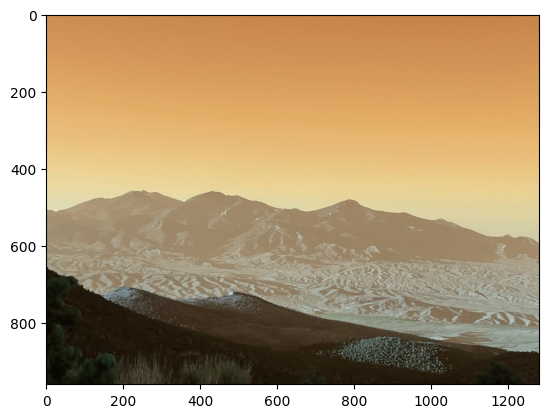

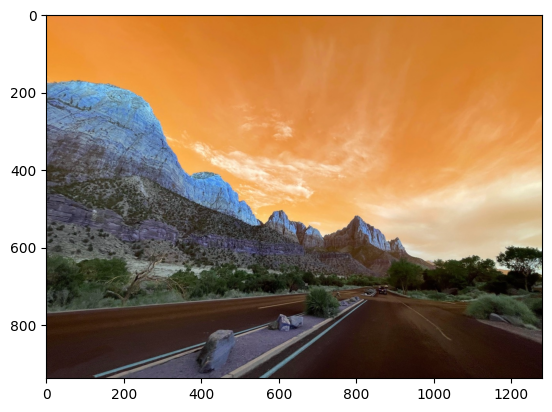

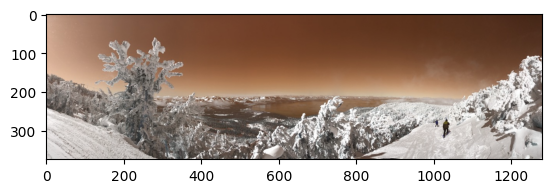

In [53]:
# Search by text. Modify the query and execute to see the search result.
searchImagesByText("mountain", searchByScaNN)

In [ ]:
# Create MatchingEngine Vector Store, online low latency ANN Database

In [8]:
DISPLAY_NAME = "multimodal_index_json"
DESCRIPTION = "Multimodal Embeddings"

In [ ]:
#Convert the image embedding into the JSON format that VME recognizes.

In [9]:
import json

with open('image_embedding.json', 'w', encoding="utf-8") as f:
    for idx, embedding in enumerate(df.embedding):
        json.dump({"id": str(idx), "embedding": embedding.tolist()}, f, ensure_ascii=False)
        f.write('\n')

! gsutil cp image_embedding.json {INDEX_DATA_BUCKET_NAME}/image_embedding.json

Copying file://image_embedding.json [Content-Type=application/json]...
/ [1 files][  1.4 MiB/  1.4 MiB]                                                
Operation completed over 1 objects/1.4 MiB.                                      


In [23]:
from google.cloud import aiplatform
aiplatform.init(project=PROJECT_ID, location=LOCATION)

In [12]:
#The MatchingEngineIndex.create_tree_ah_index() method builds an index. This takes under 10 minutes if the dataset is small, otherwise about 60 minutes or more depending on the size of the dataset. You can check status of the index creation on the Vector Search Google Cloud console
tree_ah_index = aiplatform.MatchingEngineIndex.create_tree_ah_index(
    display_name=DISPLAY_NAME,
    description=DESCRIPTION,
    dimensions=1408,
    approximate_neighbors_count=3,
    contents_delta_uri=INDEX_DATA_BUCKET_NAME,
    distance_measure_type="DOT_PRODUCT_DISTANCE",
    leaf_node_embedding_count=5,
    leaf_nodes_to_search_percent=10,
    
)

Creating MatchingEngineIndex
Create MatchingEngineIndex backing LRO: projects/456330619561/locations/us-central1/indexes/5977037567567069184/operations/212865760375078912
MatchingEngineIndex created. Resource name: projects/456330619561/locations/us-central1/indexes/5977037567567069184
To use this MatchingEngineIndex in another session:
index = aiplatform.MatchingEngineIndex('projects/456330619561/locations/us-central1/indexes/5977037567567069184')


In [13]:
INDEX_RESOURCE_NAME = tree_ah_index.resource_name

print(INDEX_RESOURCE_NAME)

projects/456330619561/locations/us-central1/indexes/5977037567567069184


In [15]:
# Create an MatchingEngineIndexEndpoint, using a public endpoint. Use a private VPC to achieve single digit MS latency
my_index_endpoint = aiplatform.MatchingEngineIndexEndpoint.create(
    display_name=DISPLAY_NAME,
    description="Endpoint for MM Embeddings",
    public_endpoint_enabled=True)
     

Creating MatchingEngineIndexEndpoint
Create MatchingEngineIndexEndpoint backing LRO: projects/456330619561/locations/us-central1/indexEndpoints/808594045206003712/operations/2697726854776750080
MatchingEngineIndexEndpoint created. Resource name: projects/456330619561/locations/us-central1/indexEndpoints/808594045206003712
To use this MatchingEngineIndexEndpoint in another session:
index_endpoint = aiplatform.MatchingEngineIndexEndpoint('projects/456330619561/locations/us-central1/indexEndpoints/808594045206003712')


In [35]:
DEPLOYED_INDEX_ID = "deployed_index_id_unique"

In [ ]:
#deploy index to online endpoint
# my_index_endpoint = my_index_endpoint.deploy_index(
#     index=tree_ah_index, deployed_index_id=DEPLOYED_INDEX_ID
# )

Deploying index MatchingEngineIndexEndpoint index_endpoint: projects/456330619561/locations/us-central1/indexEndpoints/808594045206003712
Deploy index MatchingEngineIndexEndpoint index_endpoint backing LRO: projects/456330619561/locations/us-central1/indexEndpoints/808594045206003712/operations/279293854878793728
MatchingEngineIndexEndpoint index_endpoint Deployed index. Resource name: projects/456330619561/locations/us-central1/indexEndpoints/808594045206003712


In [32]:
#greg's index endpoint, previously deployed. 
my_index_endpoint = aiplatform.MatchingEngineIndexEndpoint('projects/456330619561/locations/us-central1/indexEndpoints/808594045206003712')

In [33]:
my_index_endpoint.deployed_indexes

[id: "deployed_index_id_unique"
index: "projects/456330619561/locations/us-central1/indexes/5977037567567069184"
create_time {
  seconds: 1716146783
  nanos: 974950000
}
index_sync_time {
  seconds: 1716261475
  nanos: 829290000
}
automatic_resources {
  min_replica_count: 2
  max_replica_count: 2
}
deployment_group: "default"
]

In [31]:
#After you've built your indexes, you may query against the deployed index to find nearest neighbors.
# Encode query
text_embeddings = getTextEmbedding("mountain")

print(text_embeddings)

[-0.0152703701, 0.0218874719, -0.00149991678, 0.00648041815, -0.0173180457, 0.0221259147, -0.00273949676, 0.00585011719, 0.0199707318, 0.0184446946, 0.00343061402, 0.00343719148, 0.0089246165, 0.00544886384, 0.00547740282, -0.0134627875, -0.0101467259, 0.00872121658, 0.0106413579, 0.0143275475, 0.0215912499, -0.0121078091, -0.0122947292, -0.0062286281, 0.00537537131, 0.0178124104, -0.0200921521, 0.00229924242, 0.0305869579, -0.00187751674, 0.0134370979, 0.0157204717, 0.0168776084, 0.0141420793, -0.0298566222, 0.0330112465, 0.0318645313, -0.00349771674, -0.0322750658, 0.0148192914, 0.00569935795, -0.010572793, -0.000165815844, -0.00575978542, -0.0133485552, 0.0131620495, 0.00717723696, 0.011291408, 0.0150376009, 0.0207033567, 0.000862712681, -0.0125024132, 0.0157217029, 0.0128899952, -0.00252703694, -0.0106364423, 0.00903362874, 0.0137166549, -0.0111198891, 0.0165334418, 0.00344035635, 0.0039801104, -0.0145548787, 0.00301603856, -0.0180254709, 0.030987693, 0.0146110673, 0.00125733647, 0

In [36]:
# Define number of neighbors to return
NUM_NEIGHBORS = 3

response = my_index_endpoint.find_neighbors(
    deployed_index_id=DEPLOYED_INDEX_ID,
    queries=[text_embeddings],
    num_neighbors=NUM_NEIGHBORS)

response

[[MatchNeighbor(id='47', distance=0.08886775374412537, feature_vector=[], crowding_tag='0', restricts=[], numeric_restricts=[]),
  MatchNeighbor(id='60', distance=0.06932424008846283, feature_vector=[], crowding_tag='0', restricts=[], numeric_restricts=[]),
  MatchNeighbor(id='1', distance=0.06720107793807983, feature_vector=[], crowding_tag='0', restricts=[], numeric_restricts=[])]]

In [51]:
def searchByVertexMatchingEngine(text_embeddings, neighbor_count):

    response = my_index_endpoint.find_neighbors(
        deployed_index_id=DEPLOYED_INDEX_ID,
        queries=[text_embeddings],
        num_neighbors=NUM_NEIGHBORS)


    neighbors = []
    distances = []
    
    for neighbor in response[0]:
        neighbors.append(int(neighbor.id))
        distances.append(neighbor.distance)

    return neighbors, distances

In [44]:
searchByVertexMatchingEngine(text_embeddings, 3)

([47, 60, 1], [0.08886775374412537, 0.06932424008846283, 0.06720107793807983])

docid:15 dist:0.07763505727052689 gcsUri:gs://coca-embedding-test-images/IMG_4792 Large.jpeg
docid:24 dist:0.07214540988206863 gcsUri:gs://coca-embedding-test-images/IMG_5145 Large.jpeg
docid:35 dist:0.06800024956464767 gcsUri:gs://coca-embedding-test-images/IMG_5434 Large.jpeg
Latency (ms): 386.6760730743408


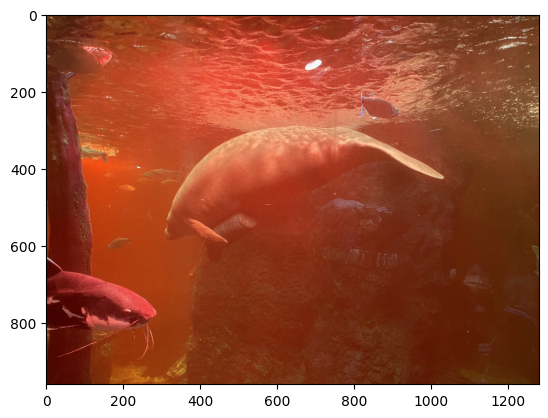

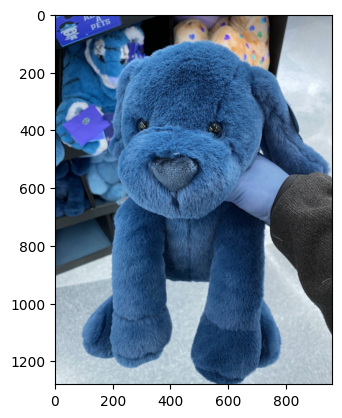

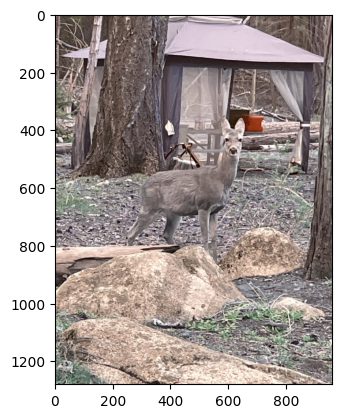

In [58]:
# Search by text. Modify the query and execute to see the search result.
searchImagesByText("animals", searchByVertexMatchingEngine)

In [81]:
#delete resources that you created by running the following code.

# Force undeployment of indexes and delete endpoint
my_index_endpoint.delete(force=True)

# Delete indexes
tree_ah_index.delete()

# Delete Cloud Storage objects that were created
delete_bucket = False
if delete_bucket or os.getenv("IS_TESTING"):
    ! gsutil -m rm -r $BUCKET_URI

NotFound: 404 IndexEndpoint `projects/456330619561/locations/us-central1/indexEndpoints/7997218659791536128` is not found.